In [1]:
import argparse
import os
import glob
import numpy as np
from matplotlib import pyplot as plt

import torch
from torch import nn, optim
from torch.utils.data import DataLoader
from torch.utils.data import Dataset
from torch.nn import functional as F

from torchvision import datasets, transforms, utils

from scheduler import CycleScheduler

# Data

In [2]:
class vid_faces(Dataset):
    """Face Landmarks dataset."""

    def __init__(self, transform=None):

        self.filenames = glob.glob('/home/jarrod/dev/virtual_assistant/256_train_data/*vid*.npy')
#         self.img_transform = transforms.Compose([
#             transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

    def __len__(self):
        return len(self.filenames)

    def __getitem__(self, idx):
          
        img = torch.Tensor(np.load(self.filenames[idx]))
        aud = torch.Tensor(np.load(self.filenames[idx].split('_vid_')[0] + '_aud_' + self.filenames[idx].split('_vid_')[1]))
        
        fn = self.filenames[idx].split('_')
        fn = fn[0] + '_' + fn[1] + '_' + fn[2] + '_' + fn[3] + '_vid_0_id.npy'
        
        id_img = torch.Tensor(np.load(fn))
        
        img = img.permute(2,0,1)
        id_img = id_img.permute(2,0,1)
        
        img = ((img / 255.0) * 2) - 1.0
        id_img = ((id_img / 255.0) * 2) - 1.0
        
#         img = self.img_transform(img)
#         id_img = self.img_transform(id_img)
        
        sample = {'id': id_img, 'image': img, 'audio': aud, 'fname':self.filenames[idx]}

        return sample

In [3]:
# grab the names of the pre-processed video files

# build datasets
dataset = vid_faces()
dataloader = DataLoader(dataset, batch_size=64, shuffle=True, num_workers=16)

# Model

In [4]:
class Quantize(nn.Module):
    def __init__(self, dim, n_embed, decay=0.99, eps=1e-5):
        super().__init__()

        self.dim = dim
        self.n_embed = n_embed
        self.decay = decay
        self.eps = eps

        embed = torch.randn(dim, n_embed)
        self.register_buffer('embed', embed)
        self.register_buffer('cluster_size', torch.zeros(n_embed))
        self.register_buffer('embed_avg', embed.clone())

    def forward(self, x):
        flatten = x.reshape(-1, self.dim)
        dist = (
            flatten.pow(2).sum(1, keepdim=True)
            - 2 * flatten @ self.embed
            + self.embed.pow(2).sum(0, keepdim=True)
        )
        _, embed_ind = (-dist).max(1)
        embed_onehot = F.one_hot(embed_ind, self.n_embed).type(flatten.dtype)
        embed_ind = embed_ind.view(*x.shape[:-1])
        quantize = self.embed_code(embed_ind)

        if self.training:
            self.cluster_size.data.mul_(self.decay).add_(
                1 - self.decay, embed_onehot.sum(0)
            )
            embed_sum = flatten.transpose(0, 1) @ embed_onehot
            self.embed_avg.data.mul_(self.decay).add_(1 - self.decay, embed_sum)
            n = self.cluster_size.sum()
            cluster_size = (
                (self.cluster_size + self.eps) / (n + self.n_embed * self.eps) * n
            )
            embed_normalized = self.embed_avg / cluster_size.unsqueeze(0)
            self.embed.data.copy_(embed_normalized)

        diff = (quantize.detach() - x).pow(2).mean()
        quantize = x + (quantize - x).detach()

        return quantize, diff, embed_ind

    def embed_code(self, embed_id):
        return F.embedding(embed_id, self.embed.transpose(0, 1))


class ResBlock(nn.Module):
    def __init__(self, in_channel, channel):
        super().__init__()

        self.conv = nn.Sequential(
            nn.ReLU(inplace=True),
            nn.Conv2d(in_channel, channel, 3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(channel, in_channel, 1),
        )

    def forward(self, x):
        out = self.conv(x)
        out += x

        return out


class Encoder(nn.Module):
    def __init__(self, in_channel, channel, n_res_block, n_res_channel, stride):
        super().__init__()

        if stride == 4:
            blocks = [
                nn.Conv2d(in_channel, channel // 2, 4, stride=2, padding=1),
                nn.ReLU(inplace=True),
                nn.Conv2d(channel // 2, channel, 4, stride=2, padding=1),
                nn.ReLU(inplace=True),
                nn.Conv2d(channel, channel, 3, padding=1),
            ]

        elif stride == 2:
            blocks = [
                nn.Conv2d(in_channel, channel // 2, 4, stride=2, padding=1),
                nn.ReLU(inplace=True),
                nn.Conv2d(channel // 2, channel, 3, padding=1),
            ]

        for i in range(n_res_block):
            blocks.append(ResBlock(channel, n_res_channel))

        blocks.append(nn.ReLU(inplace=True))

        self.blocks = nn.Sequential(*blocks)

    def forward(self, x):
        return self.blocks(x)


class Decoder(nn.Module):
    def __init__(
        self, in_channel, out_channel, channel, n_res_block, n_res_channel, stride
    ):
        super().__init__()
        
        blocks = [nn.Conv2d(in_channel, channel, 3, padding=1)]

        for i in range(n_res_block):
            blocks.append(ResBlock(channel, n_res_channel))

        blocks.append(nn.ReLU(inplace=True))

        
        
        if stride == 4:
            blocks.extend(
                [
                    nn.ConvTranspose2d(channel, channel // 2, 4, stride=2, padding=1),
                    nn.ReLU(inplace=True),
                    nn.ConvTranspose2d(channel // 2, out_channel, 4, stride=2, padding=1),
                ]
            )

        elif stride == 2:
            blocks.append(
                nn.ConvTranspose2d(channel, out_channel, 4, stride=2, padding=1)
            )

        self.blocks = nn.Sequential(*blocks)

    def forward(self, x):
        return self.blocks(x)


class VQVAE(nn.Module):
    def __init__(
        self,
        in_channel=3,
        channel=128,
        n_res_block=16,
        n_res_channel=32,
        embed_dim=64,
        n_embed=512,
        decay=0.99,
    ):
        super().__init__()
        
        self.enc_b = Encoder(in_channel, channel, n_res_block, n_res_channel, stride=4)
        self.enc_t = Encoder(channel, channel, n_res_block, n_res_channel, stride=2)
        
        self.quantize_conv_t = nn.Conv2d(channel, embed_dim, 1)
        self.quantize_t = Quantize(embed_dim, n_embed)
        
        self.dec_t = Decoder(embed_dim, embed_dim, channel, n_res_block, n_res_channel, stride=2)
        
        self.quantize_conv_b = nn.Conv2d(embed_dim + channel, embed_dim, 1)
        self.quantize_b = Quantize(embed_dim, n_embed)
        
        self.upsample_t = nn.ConvTranspose2d(embed_dim, embed_dim, 4, stride=2, padding=1)
        
        self.dec = Decoder(
            embed_dim + embed_dim,
            in_channel,
            channel,
            n_res_block,
            n_res_channel,
            stride=4,
        )

    def forward(self, x):
        
        quant_t, quant_b, diff, _, _ = self.encode(x)
         
        dec = self.decode(quant_t, quant_b)

        return dec, diff

    def encode(self, x):
        
        enc_b = self.enc_b(x)
        enc_t = self.enc_t(enc_b)

        quant_t = self.quantize_conv_t(enc_t).permute(0, 2, 3, 1)
        quant_t, diff_t, id_t = self.quantize_t(quant_t)
        quant_t = quant_t.permute(0, 3, 1, 2)
        diff_t = diff_t.unsqueeze(0)

        dec_t = self.dec_t(quant_t)
        enc_b = torch.cat([dec_t, enc_b], 1)

        quant_b = self.quantize_conv_b(enc_b).permute(0, 2, 3, 1)
        quant_b, diff_b, id_b = self.quantize_b(quant_b)
        quant_b = quant_b.permute(0, 3, 1, 2)
        diff_b = diff_b.unsqueeze(0)

        return quant_t, quant_b, diff_t + diff_b, id_t, id_b

    def decode(self, quant_t, quant_b):
           
        upsample_t = self.upsample_t(quant_t)
        
        quant = torch.cat([upsample_t, quant_b], 1)
        
        dec = self.dec(quant)

        return dec

    # not used
    def decode_code(self, code_t, code_b):
        quant_t = self.quantize_t.embed_code(code_t)
        quant_t = quant_t.permute(0, 3, 1, 2)
        quant_b = self.quantize_b.embed_code(code_b)
        quant_b = quant_b.permute(0, 3, 1, 2)

        dec = self.decode(quant_t, quant_b)

        return dec

# Train

In [5]:
device = 'cuda'

latent_loss_weight = 0.25

EPOCHS = 80
LR = 1e-3

mse_sum = 0
mse_n = 0

#model = nn.DataParallel(VQVAE()).to(device)
model = VQVAE().to(device)

optimizer = optim.Adam(model.parameters(), lr=LR)
criterion = nn.MSELoss()
criterion2 = nn.MSELoss()

scheduler = None

In [8]:
model.load_state_dict(torch.load('./model_dir/GAG_256_RES_16_29'))

<All keys matched successfully>

In [21]:
for i, batch in enumerate(dataloader):

    break

In [12]:
images = (batch['image'].permute(0,2,3,1).detach().numpy()+1)/2.0

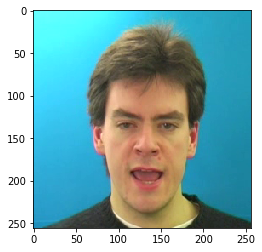

In [13]:
plt.imshow(images[0])

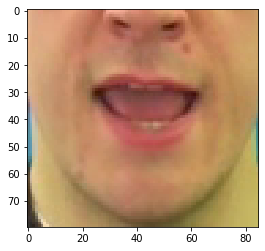

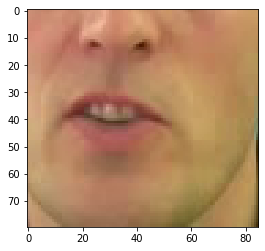

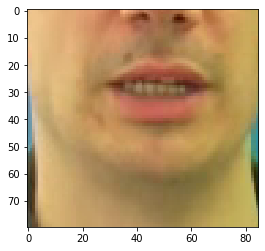

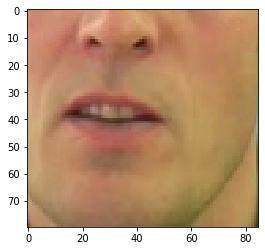

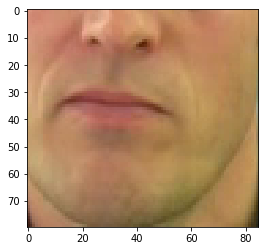

...

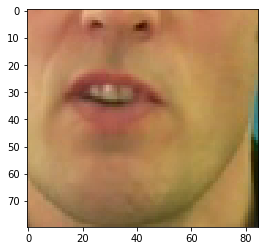

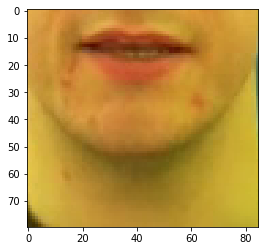

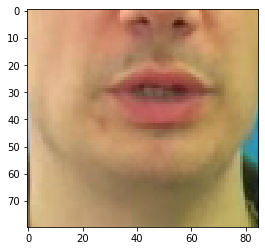

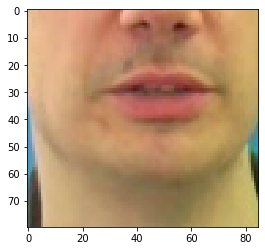

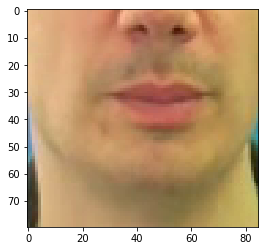

In [22]:
for img in images:

    plt.imshow(img[160:240,90:175])
    plt.show()

face loss:  0 MSE:  0.003412946593016386 latent loss:  0.0002553975209593773 avg MSE:  0.00411508971188992 epoch:  30 image:  100


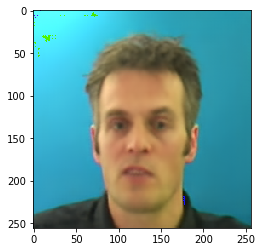

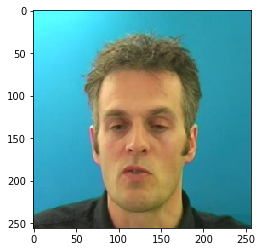

face loss:  0 MSE:  0.0033863349817693233 latent loss:  0.00024369865423068404 avg MSE:  0.0037526246137101556 epoch:  30 image:  200


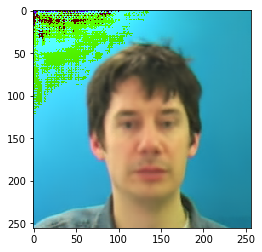

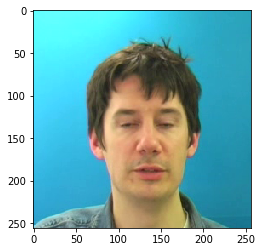

face loss:  0 MSE:  0.003636691253632307 latent loss:  0.00034423067700117826 avg MSE:  0.0036225504747768277 epoch:  30 image:  300


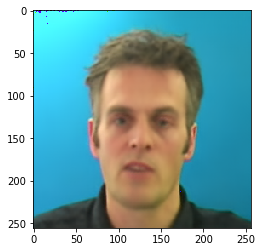

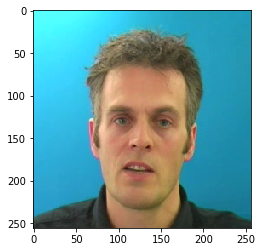

face loss:  0 MSE:  0.003097544191405177 latent loss:  0.00021473907690960914 avg MSE:  0.003567349321866162 epoch:  30 image:  400


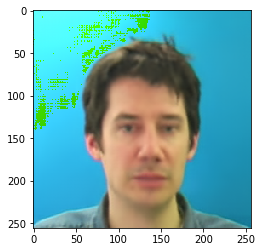

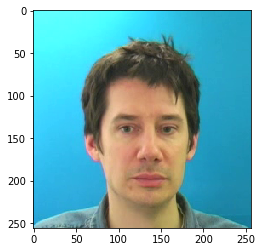

face loss:  0 MSE:  0.003703804686665535 latent loss:  0.0002454361238051206 avg MSE:  0.003536229274196628 epoch:  30 image:  500


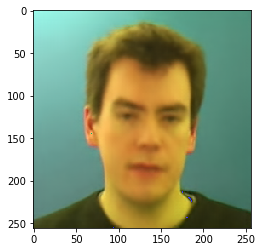

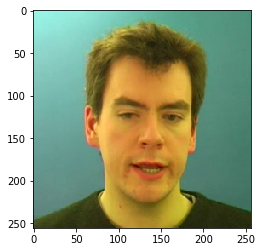

face loss:  0 MSE:  0.0034566479735076427 latent loss:  0.00028271463816054165 avg MSE:  0.003531508708292132 epoch:  30 image:  600


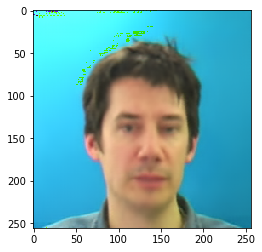

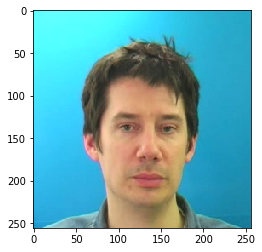

face loss:  0 MSE:  0.0036266124807298183 latent loss:  0.00036758629721589386 avg MSE:  0.003513550578806544 epoch:  30 image:  700


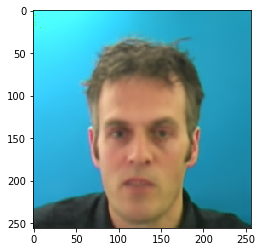

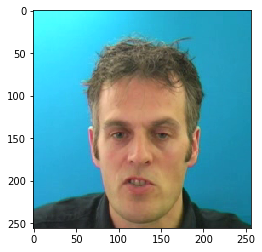

face loss:  0 MSE:  0.003136284649372101 latent loss:  0.00023753709683660418 avg MSE:  0.003510534744732984 epoch:  30 image:  800


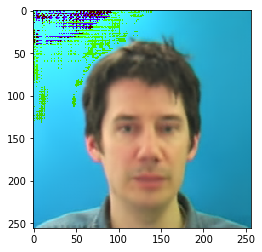

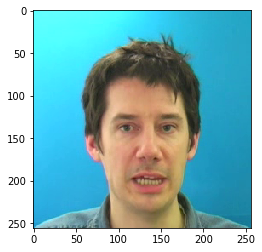

face loss:  0 MSE:  0.003331325016915798 latent loss:  0.00023546599550172687 avg MSE:  0.0034994193317614635 epoch:  30 image:  900


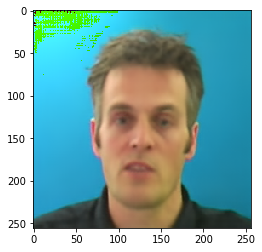

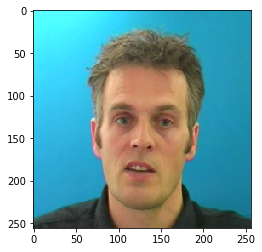

face loss:  0 MSE:  0.0026913858018815517 latent loss:  0.00020543266145978123 avg MSE:  0.0035045218363694555 epoch:  30 image:  1000


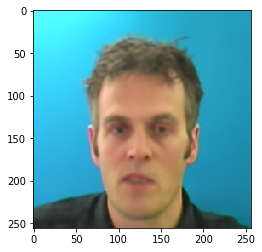

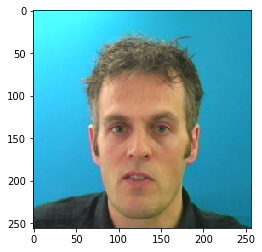

face loss:  0 MSE:  0.004325183108448982 latent loss:  0.00035227974876761436 avg MSE:  0.0034962887116551373 epoch:  30 image:  1100


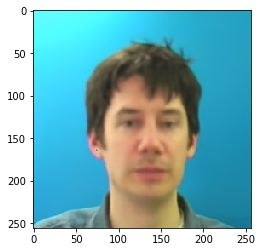

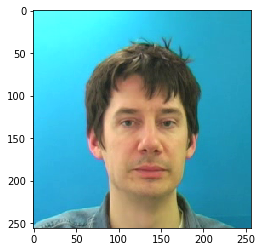

face loss:  0 MSE:  0.0033934253733605146 latent loss:  0.0002576585393399 avg MSE:  0.0034987440605730837 epoch:  30 image:  1200


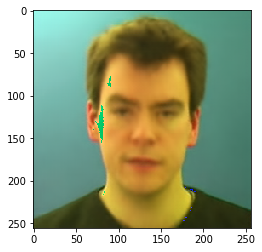

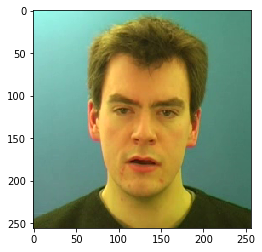

face loss:  0 MSE:  0.003048410639166832 latent loss:  0.00022527034161612391 avg MSE:  0.0034994214662579072 epoch:  30 image:  1300


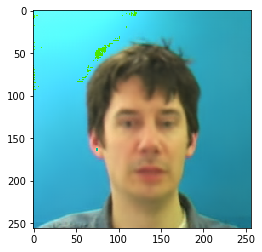

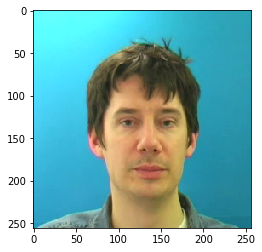

face loss:  0 MSE:  0.0030485973693430424 latent loss:  0.00026258727302774787 avg MSE:  0.0034985770434832505 epoch:  30 image:  1400


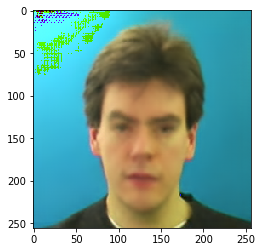

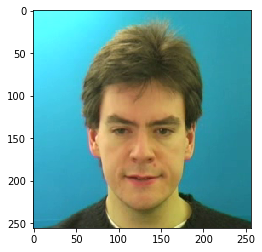

face loss:  0 MSE:  0.004079808015376329 latent loss:  0.00022332934895530343 avg MSE:  0.0034970613973628454 epoch:  30 image:  1500


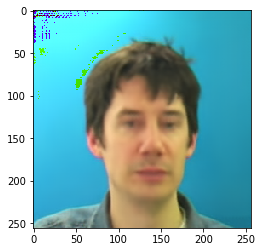

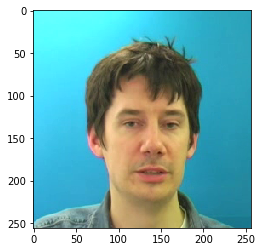

face loss:  0 MSE:  0.0030843191780149937 latent loss:  0.00019703427096828818 avg MSE:  0.0034903750174924927 epoch:  30 image:  1600


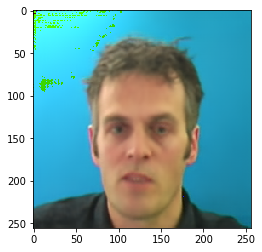

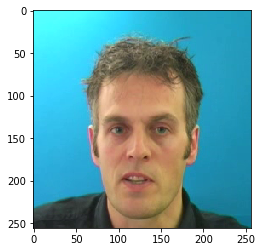

face loss:  0 MSE:  0.0032520282547920942 latent loss:  0.00021900924912188202 avg MSE:  0.003488992175102663 epoch:  30 image:  1700


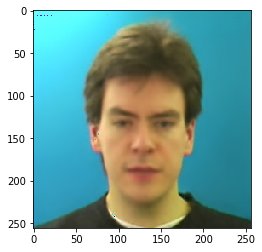

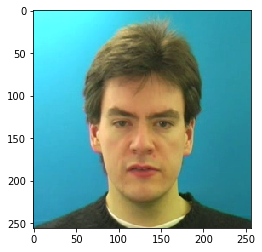

face loss:  0 MSE:  0.0038108767475932837 latent loss:  0.00025563003146089613 avg MSE:  0.0034930619253709227 epoch:  30 image:  1800


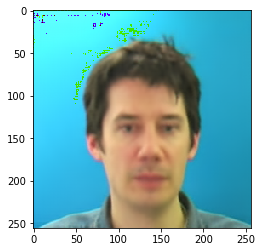

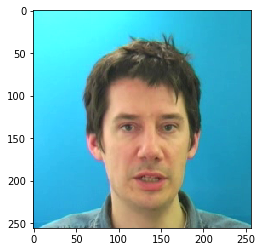

face loss:  0 MSE:  0.0035400576889514923 latent loss:  0.0002809333673212677 avg MSE:  0.0034905570535442897 epoch:  30 image:  1900


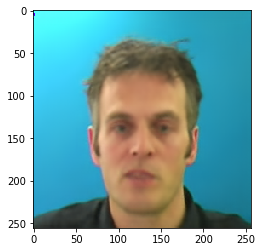

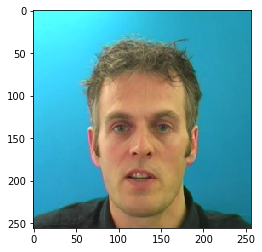

face loss:  0 MSE:  0.0033231149427592754 latent loss:  0.0002518064284231514 avg MSE:  0.003490115605715452 epoch:  30 image:  2000


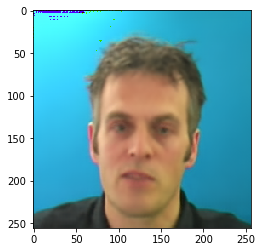

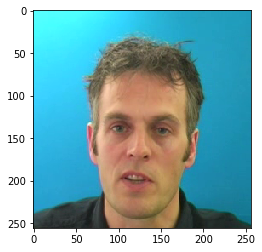

face loss:  0 MSE:  0.0030570286326110363 latent loss:  0.0002346387191209942 avg MSE:  0.003491542765627775 epoch:  30 image:  2100


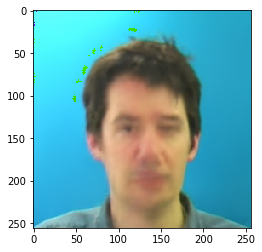

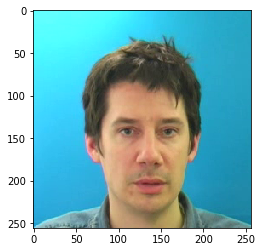

face loss:  0 MSE:  0.0037610018625855446 latent loss:  0.0002984117018058896 avg MSE:  0.0034942851278732877 epoch:  30 image:  2200


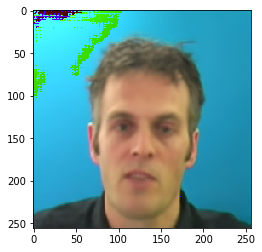

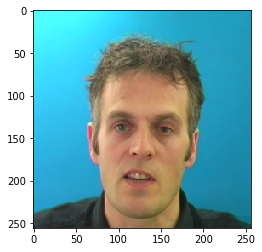

face loss:  0 MSE:  0.003719187807291746 latent loss:  0.00028845499036833644 avg MSE:  0.0034934288122104736 epoch:  30 image:  2300


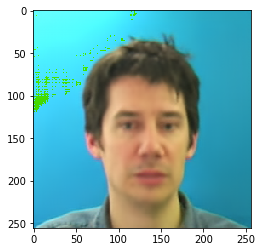

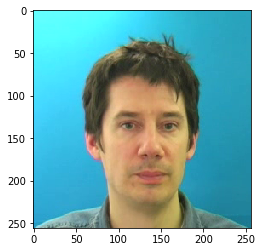

face loss:  0 MSE:  0.0037662561517208815 latent loss:  0.00031376018887385726 avg MSE:  0.0034911026608940524 epoch:  30 image:  2400


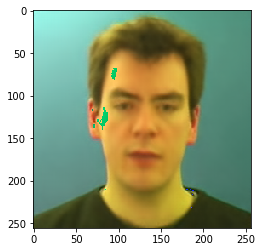

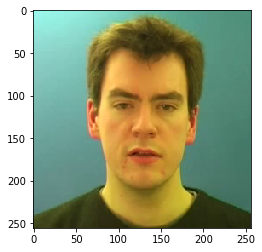

face loss:  0 MSE:  0.003447272814810276 latent loss:  0.0002489163016434759 avg MSE:  0.003492528745369827 epoch:  30 image:  2500


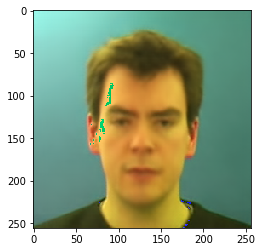

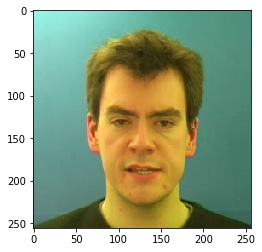

face loss:  0 MSE:  0.003697279840707779 latent loss:  0.0002667433873284608 avg MSE:  0.0034899873448115434 epoch:  30 image:  2600


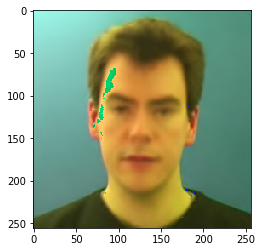

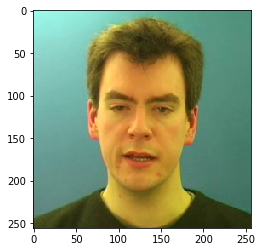

face loss:  0 MSE:  0.003790242364630103 latent loss:  0.0002579804277047515 avg MSE:  0.0034928366255500623 epoch:  30 image:  2700


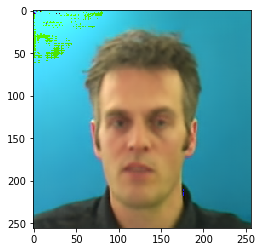

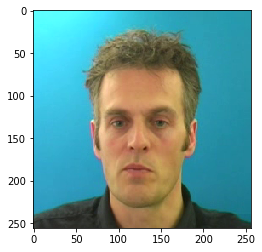

face loss:  0 MSE:  0.003783141728490591 latent loss:  0.0002593304088804871 avg MSE:  0.003496132890043148 epoch:  30 image:  2800


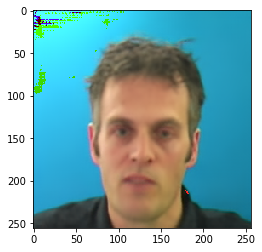

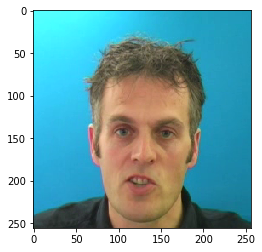

face loss:  0 MSE:  0.004594886209815741 latent loss:  0.000269276846665889 avg MSE:  0.0034966324565990584 epoch:  30 image:  2900


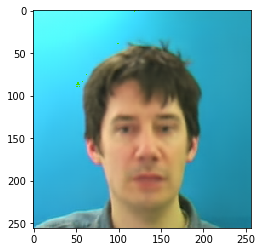

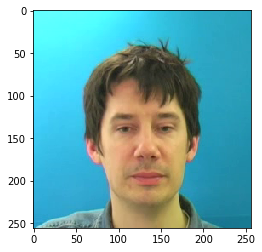

face loss:  0 MSE:  0.003169586881995201 latent loss:  0.0002325392997590825 avg MSE:  0.003496979982385791 epoch:  30 image:  3000


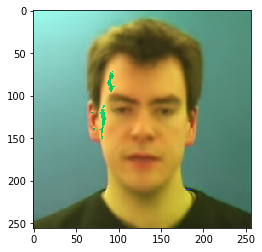

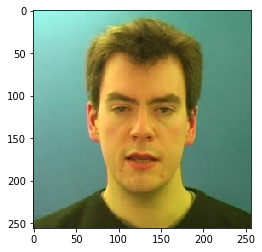

face loss:  0 MSE:  0.003402281552553177 latent loss:  0.00034400931326672435 avg MSE:  0.0035003694463599327 epoch:  30 image:  3100


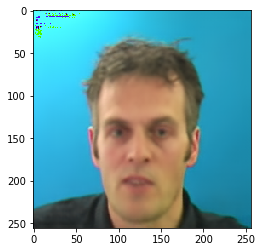

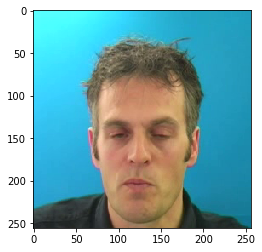

face loss:  0 MSE:  0.003426540642976761 latent loss:  0.00024897008552215993 avg MSE:  0.003497332691438135 epoch:  30 image:  3200


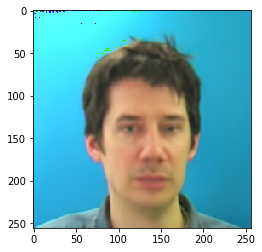

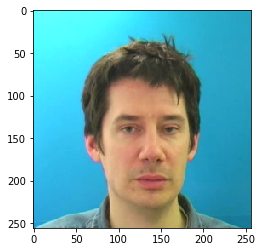

face loss:  0 MSE:  0.0034533715806901455 latent loss:  0.00026120044640265405 avg MSE:  0.003495410442116996 epoch:  30 image:  3300


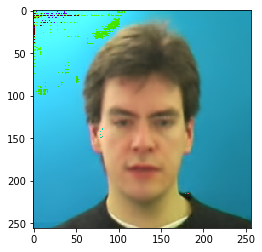

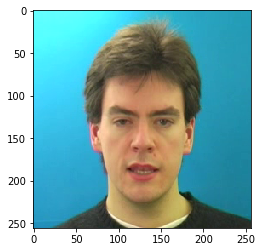

face loss:  0 MSE:  0.0034269464667886496 latent loss:  0.0002816022315528244 avg MSE:  0.0034938536887515804 epoch:  30 image:  3400


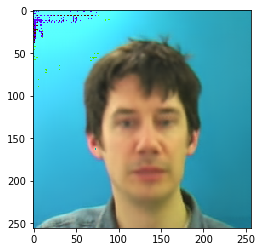

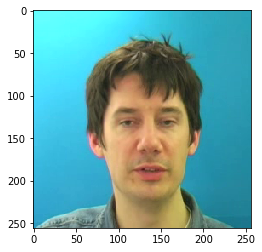

face loss:  0 MSE:  0.0038954787887632847 latent loss:  0.0002627619542181492 avg MSE:  0.0034616900916847556 epoch:  31 image:  100


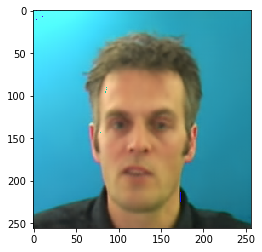

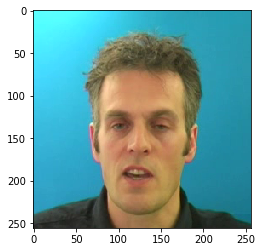

face loss:  0 MSE:  0.00406850827857852 latent loss:  0.0002760169154498726 avg MSE:  0.00346126710759726 epoch:  31 image:  200


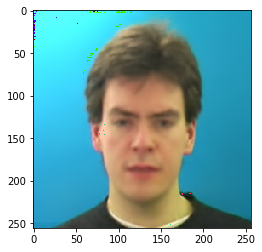

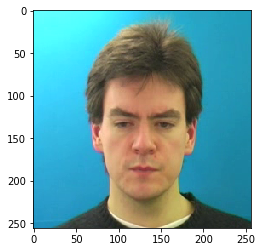

face loss:  0 MSE:  0.0034858461003750563 latent loss:  0.00029083125991746783 avg MSE:  0.0034663945813957243 epoch:  31 image:  300


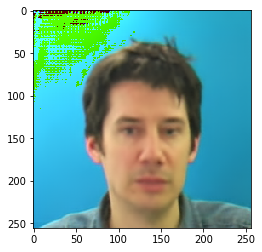

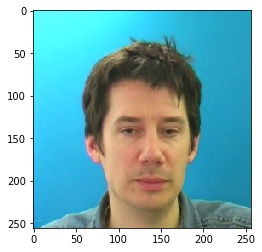

face loss:  0 MSE:  0.003081214614212513 latent loss:  0.00022802528110332787 avg MSE:  0.0034769075339720432 epoch:  31 image:  400


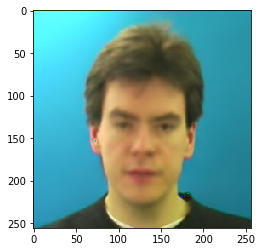

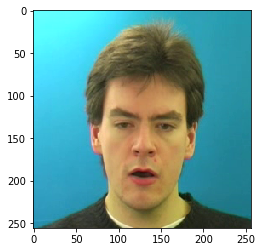

face loss:  0 MSE:  0.0036310148425400257 latent loss:  0.00029675973928533494 avg MSE:  0.0034874769921290007 epoch:  31 image:  500


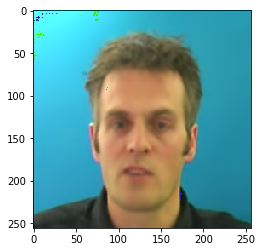

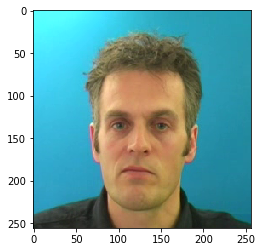

face loss:  0 MSE:  0.0028675696812570095 latent loss:  0.00023679017613176256 avg MSE:  0.003485793562004724 epoch:  31 image:  600


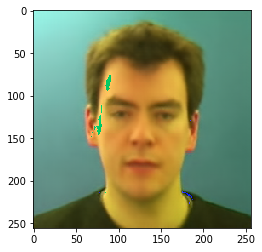

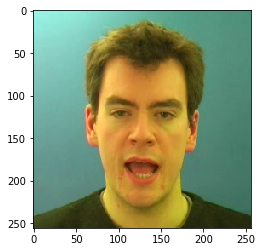

face loss:  0 MSE:  0.004033583216369152 latent loss:  0.00024451554054394364 avg MSE:  0.0034736140439161943 epoch:  31 image:  700


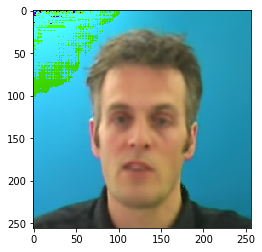

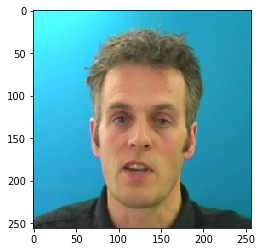

face loss:  0 MSE:  0.003682208014652133 latent loss:  0.000304394809063524 avg MSE:  0.003461299291445633 epoch:  31 image:  800


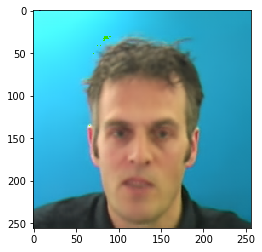

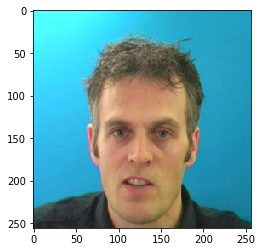

face loss:  0 MSE:  0.003928146790713072 latent loss:  0.00029910739976912737 avg MSE:  0.0034678932775502463 epoch:  31 image:  900


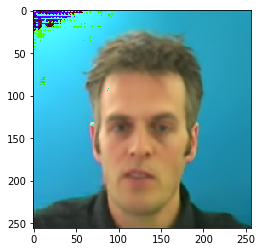

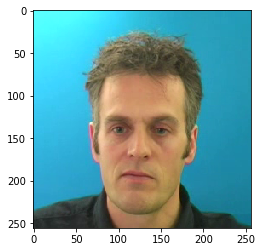

face loss:  0 MSE:  0.0033631916157901287 latent loss:  0.000262674642726779 avg MSE:  0.0034710237352581293 epoch:  31 image:  1000


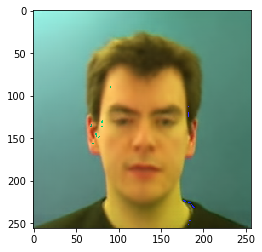

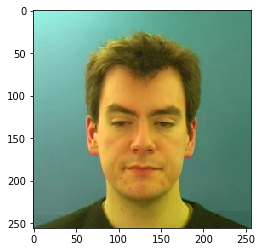

face loss:  0 MSE:  0.0036783262621611357 latent loss:  0.00026586430612951517 avg MSE:  0.0034729677523578518 epoch:  31 image:  1100


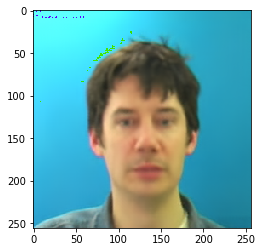

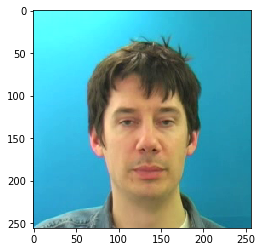

face loss:  0 MSE:  0.0037131193093955517 latent loss:  0.0002444495912641287 avg MSE:  0.003471758174938735 epoch:  31 image:  1200


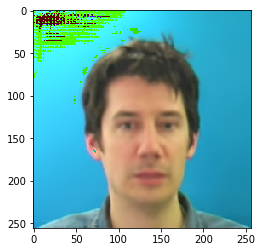

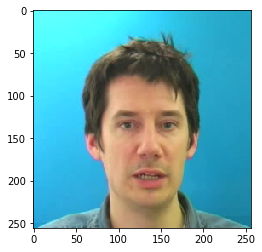

face loss:  0 MSE:  0.0034407589118927717 latent loss:  0.0002590303774923086 avg MSE:  0.0034712936215927333 epoch:  31 image:  1300


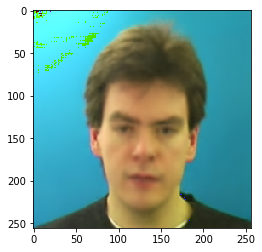

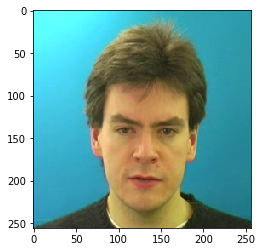

face loss:  0 MSE:  0.0033036477398127317 latent loss:  0.00028413295513018966 avg MSE:  0.003474069105961136 epoch:  31 image:  1400


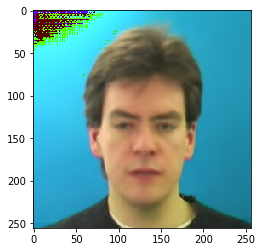

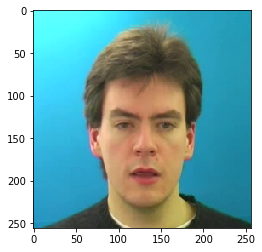

face loss:  0 MSE:  0.003732033772394061 latent loss:  0.0003019999130629003 avg MSE:  0.0034708045022828946 epoch:  31 image:  1500


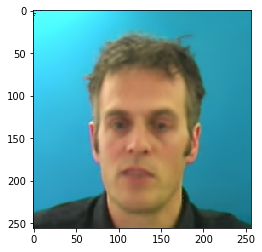

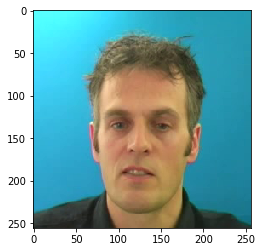

face loss:  0 MSE:  0.003029996994882822 latent loss:  0.0002529956109356135 avg MSE:  0.003474740977419411 epoch:  31 image:  1600


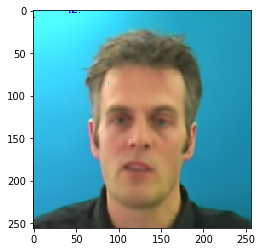

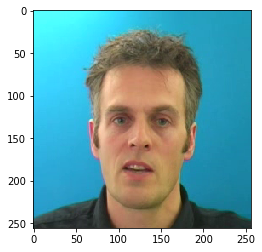

face loss:  0 MSE:  0.0030586752109229565 latent loss:  0.00029856234323233366 avg MSE:  0.0034734843998790437 epoch:  31 image:  1700


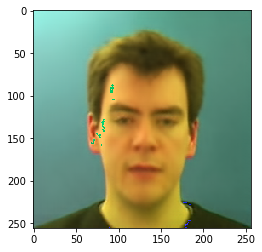

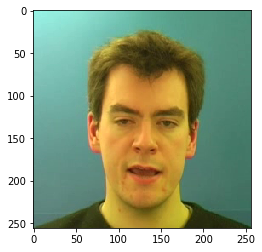

face loss:  0 MSE:  0.0033574178814888 latent loss:  0.0003433241799939424 avg MSE:  0.0034767659656395273 epoch:  31 image:  1800


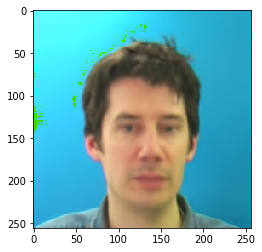

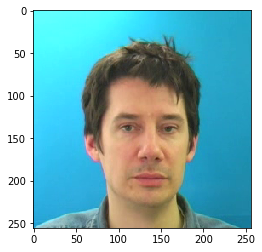

face loss:  0 MSE:  0.0032704565674066544 latent loss:  0.00029986363369971514 avg MSE:  0.0034764336768943406 epoch:  31 image:  1900


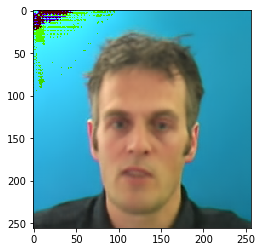

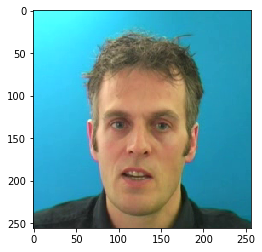

face loss:  0 MSE:  0.0034955560695379972 latent loss:  0.00020790068083442748 avg MSE:  0.0034807643172205956 epoch:  31 image:  2000


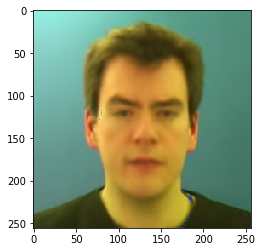

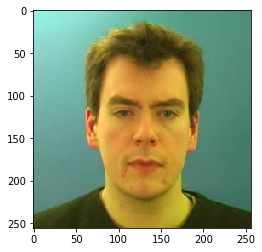

face loss:  0 MSE:  0.0033842879347503185 latent loss:  0.00025120913051068783 avg MSE:  0.003480727880637293 epoch:  31 image:  2100


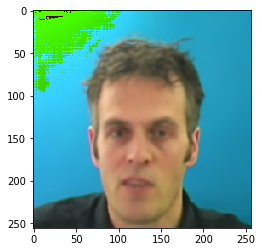

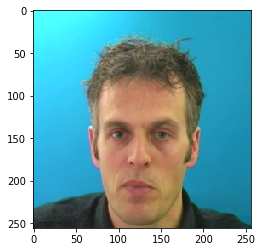

face loss:  0 MSE:  0.003284769831225276 latent loss:  0.00029831353458575904 avg MSE:  0.0034791263144485305 epoch:  31 image:  2200


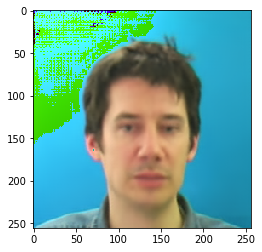

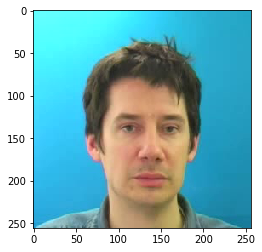

face loss:  0 MSE:  0.0029867850244045258 latent loss:  0.00021151025430299342 avg MSE:  0.003478047430983986 epoch:  31 image:  2300


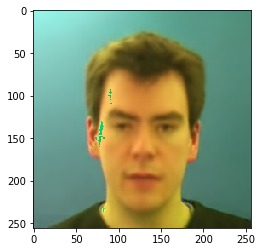

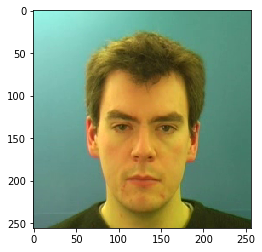

face loss:  0 MSE:  0.0038229324854910374 latent loss:  0.0003191495197825134 avg MSE:  0.003476408920675572 epoch:  31 image:  2400


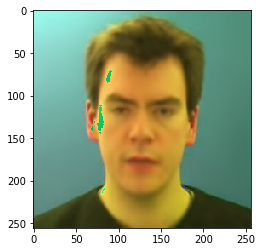

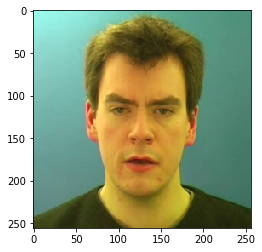

face loss:  0 MSE:  0.003642239375039935 latent loss:  0.00020717273582704365 avg MSE:  0.0034759482844542414 epoch:  31 image:  2500


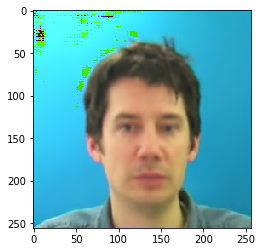

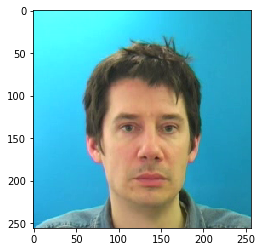

In [ ]:
for e in range(30,EPOCHS,1):

    mse_sum = 0
    mse_n = 0

    for i, batch in enumerate(dataloader):

        model.zero_grad()

#         if batch['image'].shape[0] != 128:
#             continue

        img = batch['image'].to(device)
#         aud = batch['audio'].view(128,1,10000).to(device)
        id_img = batch['id'].to(device)

        out, latent_loss = model(id_img)
        recon_loss = criterion(out, img)

    #     lower_face_loss = criterion2(out[:,:,:80,:], img[:,:,:80,:])

        lower_face_loss = 0

        latent_loss = latent_loss.mean()

        loss = recon_loss + latent_loss_weight * latent_loss
        loss.backward()

        if scheduler is not None:
            scheduler.step()

        optimizer.step()

        mse_sum += recon_loss.item() * img.shape[0]
        mse_n += img.shape[0]

        lr = optimizer.param_groups[0]['lr']

        if i % 100 == 0 and i != 0:
            print("face loss: ", lower_face_loss, "MSE: ", recon_loss.item(), 
                  "latent loss: ", latent_loss.item(), "avg MSE: ", mse_sum / mse_n, "epoch: ", e, "image: ", i)
            test_img = (np.moveaxis(out.cpu().detach().numpy(),1,-1) + 1) / 2.0 * 255
            inp_img = (np.moveaxis(img.cpu().detach().numpy(),1,-1) + 1) / 2.0 * 255
            plt.imshow(test_img[40].astype(np.uint8))
            plt.show()
            plt.imshow(inp_img[40].astype(np.uint8))
            plt.show()

    torch.save(model.state_dict(), './model_dir/GAG_256_RES_16_' + str(e))

    #     loader.set_description(
    #         (
    #             f'epoch: {epoch + 1}; mse: {recon_loss.item():.5f}; '
    #             f'latent: {latent_loss.item():.3f}; avg mse: {mse_sum / mse_n:.5f}; '
    #             f'lr: {lr:.5f}'
    #         )
    #     )

    #     if i % 100 == 0:
    #         model.eval()

    #         sample = img[:sample_size]

    #         with torch.no_grad():
    #             out, _ = model(sample)

    #         utils.save_image(
    #             torch.cat([sample, out], 0),
    #             f'sample/{str(epoch + 1).zfill(5)}_{str(i).zfill(5)}.png',
    #             nrow=sample_size,
    #             normalize=True,
    #             range=(-1, 1),
    #         )

    #         model.train()

# Create Animation

In [ ]:
# grab the names of the pre-processed video files
video_names = glob.glob('/home/jarrod/dev/speech-driven-animation/data/aligned_faces/*.npy')

# delete bad entries
bad_files = ['bgit2n', 'lbij7a', 'lrbr3s', 'pbio7a', 'sbaa4p', 'sgwp8p', 'sbim8p', 
             'srwi5a', 'swao7a', 'srbb4n', 'sbbbzp', 'lrae3s']

for i,f in enumerate(video_names):
    
    for bad in bad_files:
        if f.find(bad) != -1:
            del video_names[i]
            break

In [ ]:
class getDataSample():
    def __init__(self, gpu=1):

        self.audio_path = '/home/jarrod/dev/speech-driven-animation/data/npy_audio/'
        self.device = torch.device("cuda:" + str(gpu))

        self.mean_face = np.load('/home/jarrod/dev/speech-driven-animation/data/mean_face.npy')
        self.img_size = (128,128)
        self.aux_latent = 10
        self.sequential_noise = True
    
        rnn_gen_dim = 256
        id_enc_dim = 128
        aud_enc_dim = 256
        audio_feat_len = 0.2
        self.audio_rate = 50000
        self.video_rate = 25
        self.audio_feat_samples = 10000
        self.conversion_dict = {'s16': np.int16, 's32': np.int32}
        
        # image preprocessing
        self.img_transform = transforms.Compose([
            transforms.ToPILImage(),
            transforms.Resize((self.img_size[0], self.img_size[1])),
            transforms.ToTensor(),
            transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])


    def preprocess_img(self, img):
        src = self.fa.get_landmarks(img)[0][self.stablePntsIDs, :]
        dst = self.mean_face[self.stablePntsIDs, :]
        tform = tf.estimate_transform('similarity', src, dst)  # find the transformation matrix
        warped = tf.warp(img, inverse_map=tform.inverse, output_shape=self.img_size)  # wrap the frame image
        warped = warped * 255  # note output from wrap is double image (value range [0,1])
        warped = warped.astype('uint8')

        return warped

    def __call__(self, filename, num_d1_samples, fs=None, aligned=False):
        
        audio_filename = self.audio_path + filename.split('/')[-1].split('.npy')[0] + '.wav.npy'
        
       
    
        vid_data = np.load(filename)
        frame = np.copy(vid_data[0])
                
        # take the input image and preprocess it    
        frame = self.img_transform(frame)
            
        frame = frame.unsqueeze(0)
        
        # Load preprocessed audio data
        audio_feat_seq = np.load(audio_filename)
        
        audio_feat_seq = torch.Tensor(audio_feat_seq)
        audio_feat_seq_length = audio_feat_seq.shape[1]
                
        samp = np.random.rand(num_d1_samples)*audio_feat_seq_length
        samp = samp.astype(int)

        
        normed_vid_data = []
        
        for i, img in enumerate(vid_data):
            normed_vid_data.append((self.img_transform(img)+ 1.0) / 2.0)
        
        normed_vid_data = torch.stack(normed_vid_data)
        
#         d1_frames = normed_vid_data[samp]

        # shuffle the id frames, otherwise the discriminator learns too fast    
#         np.random.shuffle(samp)
#         d1_frames_shuff = normed_vid_data[samp]

#         frame_c = frame.repeat(num_d1_samples,1,1,1) 
        # concat the id_frame onto the back of axis 1 (indices 3:)
#         d1_frames = torch.cat((d1_frames, d1_frames_shuff), axis=1)
        
        
        return audio_feat_seq, audio_feat_seq_length, frame, normed_vid_data

In [ ]:
va = getDataSample()
aud, _, _, vid  = va(video_names[0], 10, aligned=True)

In [ ]:
model.eval()

In [ ]:
img = batch['image'].to(device)
aud = batch['audio'].view(128,1,10000).to(device)
id_img = batch['id'].to(device)


out, latent_loss = model(id_img, aud)

In [ ]:
vid = vid.to(device)

In [ ]:
aud = aud.view(75,1,10000)

In [ ]:
pad = torch.zeros(53,3,128,128).to(device)

In [ ]:
new_aud = torch.cat((aud, pad),0) 

In [ ]:
new_vid = torch.cat((vid, pad),0) 

In [ ]:
new_aud = new_aud.to(device)

In [ ]:
video_names[0]

In [ ]:
out, latent_loss = model(new_vid, new_aud)

In [ ]:
output = out.permute(0,2,3,1).cpu().detach().numpy()

In [ ]:
import skvideo.io as sio
import ffmpeg

In [ ]:
def save_video(video, overwrite=True, experimental_ffmpeg=False, scale=None):
      
      
        
        # Save the video file
        writer = sio.FFmpegWriter("/home/jarrod/dev/vq-vae-2-pytorch/tmp.avi",
                                  inputdict={'-r': str(24) + "/1", },
                                  outputdict={'-r': str(24) + "/1", }
                                  )
        for i in range(video.shape[0]):
#             frame = np.rollaxis(video[i, :, :, :], 0, 3)

#             if scale is not None:
#                 frame = tf.rescale(frame, scale, anti_aliasing=True, multichannel=True, mode='reflect')

            writer.writeFrame(video[i])
        writer.close()

In [ ]:
save_video(output)

In [ ]:
out.shape

In [ ]:
output = np.clip(output,0,1.0)

In [ ]:
output = output * 255

In [ ]:
output = output.astype(np.uint8)

In [ ]:
output.shape

# Debug

In [ ]:
for i, batch in enumerate(dataloader):

        model.zero_grad()

#         if batch['image'].shape[0] != 128:
#             continue

        img = batch['image'].to(device)
        aud = batch['audio'].view(128,1,10000).to(device)
        id_img = batch['id'].to(device)


        out, latent_loss = model(id_img)
        
        break

In [ ]:
test = batch['image'].permute(0,2,3,1).cpu().detach().numpy()

test_out = out.permute(0,2,3,1).cpu().detach().numpy()

np.min(test), np.max(test), np.min(test_out), np.max(test_out)

plt.imshow(test[0])

In [ ]:
inp_img = np.moveaxis(img.cpu().detach().numpy(),1,-1)
plt.imshow(inp_img[60])
plt.show()

In [ ]:
for i, batch in enumerate(dataloader):
    
    model.zero_grad()

    if batch['image'].shape[0] != 128:
        continue
    
    img = batch['image'].to(device)
    aud = batch['audio'].view(128,1,10000).to(device)
    id_img = batch['id'].to(device)
    
    
    out, latent_loss = model(img, aud)
    break

In [ ]:
out = out[20].permute(1,2,0).cpu().detach().numpy()
target = batch['image'][20].permute(1,2,0).cpu().detach().numpy()
diff = np.sqrt(np.square(out - target))

In [ ]:
plt.imshow(out)
plt.show()
plt.imshow(target)
plt.show()
plt.imshow(diff)
plt.show()

In [ ]:
np.max(diff)

In [ ]:
out.shape

In [ ]:
out[:,:,:10,:10] = 1